<center><span style="font-size:30px;"><span style="font-family: 'Times New Roman', Times, serif;">Proyecto Final Procesamiento de Señales.</span></span></center><br>
<center><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">Jonnier Moreno Bertel.</span><br></center>
<center><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">CC: 1007934647</span></center><br>
<center><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">2023-1</span></center>


<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">Contexto 1: </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;">Se ha corrido el rumor de que usted es muy bueno utilizando filtros analogicos y es contratado por una empresa que investiga la vida salvaje. Dicha empresa está interesada en poner a prueba sus habilidades. </span>

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">1. Diseño de filtro FIR con respuesta finita al impulso</span></b><br>

| <center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;">Respuesta filtro ideal</span></center>                                             |<center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;">Tipo de Filtro</span></center>|
|---------------------------                                                          |---------------------------        |
| <center>h<sub>1</sub> =  (ω<sub>c</sub>/π)sin<sub>a</sub>(ω<sub>c</sub>n)/(ω<sub>c</sub>n)</center>|<center>Pasa–bajas</center>        |
| <center>h<sub>2</sub> = -(ω<sub>c</sub>/π)sin<sub>a</sub>(ω<sub>c</sub>n)/(ω<sub>c</sub>n)</center>|<center>Pasa–altas</center>        |
| <center>h<sub>3</sub> = (ω<sub>c</sub><sub>2</sub>/π)sin<sub>a</sub>(ω<sub>c</sub><sub>2</sub>n)/(ω<sub>c</sub><sub>2</sub>n)-(ω<sub>c</sub><sub>1</sub>/π)sin<sub>a</sub>(ω<sub>c</sub><sub>1</sub>n)/(ω<sub>c</sub><sub>1</sub>n)</center>|<center>Pasa–banda</center>|
| <center>h<sub>4</sub> = (ω<sub>c</sub><sub>1</sub>/π)sin<sub>a</sub>(ω<sub>c</sub><sub>1</sub>n)/(ω<sub>c</sub><sub>1</sub>n)-(ω<sub>c</sub><sub>2</sub>/π)sin<sub>a</sub>(ω<sub>c</sub><sub>2</sub>n)/(ω<sub>c</sub><sub>2</sub>n)</center>|<center>Rechaza–banda</center>|

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">1.1. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Diseñe un filtro pasabajas con frecuencia de corte 400Hz, y frecuencia de muestreo 20000Hz. Recuerde normalizar las frecuencias respecto la frecuencia de muestreo.

Orden del filtro:  63


C:\Users\Jonni\AppData\Local\Temp\ipykernel_15752\2333392439.py:23: RuntimeWarning: invalid value encountered in divide
  hi=(wc/np.pi)*(np.sin(wc*n)/(wc*n))


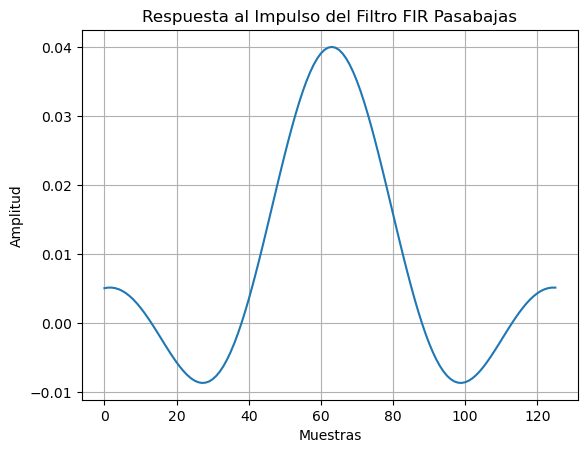

In [1]:
import scipy.signal as signal
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pylab import *
%matplotlib inline
# Parámetros del filtro
fs = 20000  # Frecuencia de muestreo en Hz
fc = 400
# Frecuencia de corte en Hz
Adb=0 # Ganancia del filtro en decibeles
N = 512 # Numero de puntos de la FFT
BW=200 # Ancho de banda en la banda de transicion
bwn=2*np.pi*BW/fs # ancho de banda  normalizado en radianes

M=int(4/bwn) # orden estimado del filtro
print('Orden del filtro: ', M)

n = np.arange(-M,M)
wc = 2 * np.pi * fc/fs

# Generar los coeficientes del filtro pasabajas
#hi = ((wc/np.pi) * np.sin(wc*n/np.pi))/(wc*n/np.pi)
hi=(wc/np.pi)*(np.sin(wc*n)/(wc*n))
hi[n==0] = wc/np.pi

# Calcular la respuesta al impulso del filtro
t = np.arange(len(hi))  # Eje temporal
plt.plot(t, hi)
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.title('Respuesta al Impulso del Filtro FIR Pasabajas')
plt.grid(True)
plt.show()

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">1.2. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> ¿Qué función debe toma la expresión del filtro pasabajas en n = 0 para evitar la indeterminación? 

Bonus: ¿Cómo debe la función en n = 0 para los demás filtros?

Respuesta: 

Filtro pasa-bajas: h1[n==0] = ω<sub>c</sub>/π

Bonus:

Filtro pasa-altas: h2[n==0] = 1 - ω<sub>c</sub>/π

Filtro pasa-banda: h3[n==0] = 2(f<sub>c2</sub>-f<sub>c1</sub>)

Filtro pasa-banda: h4[n==0] = 1 - 2(f<sub>c2</sub>-f<sub>c1</sub>)

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">1.3. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Según su último digito de cedula seleccione una ventana para el filtro, explique qué función cumple en el filtro, ¿Teoricamente cuales son las caracteristicas sobre las cuales incide la ventana?

| <center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;"> Último digito Cedula</span></center>|<center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;">Tipo de ventana</span></center>|
|---------------------------                                                          |---------------------------        |
| <center>1,3,5</center>|<center>Rectangular</center>        |
| <center>2,4,6</center>|<center>Hanning</center>        |
| <center>7,9 </center>|<center>Hamming</center>|
| <center>8</center>|<center>Blackman</center>|

In [2]:
def choose_windows(name='Hamming', N=20):
    # Rect/Hanning/Hamming/Blackman
    if name == 'Hamming':
        window = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
        
    elif name == 'Hanning':
        window = np.array([0.5 - 0.5 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Rect':
        window = np.ones(N)
    elif name == 'black':
        window = np.array([0.42-0.5*np.cos((2*np.pi*n)/(N-1))+0.08*np.cos((4*np.pi*n)/(N-1))for n in range(N)])
    return window

Ventana = choose_windows(name='Hamming', N=len(n))
h=hi*Ventana # Multiplico la respuesta ideal por la ventana
#Se crea la ganancia del filtro
A=np.sqrt(10**(0.1*Adb))
h=h*A # Ganancia del filtro
w1,Hh1 = signal.freqz(hi,1,whole=True, worN=N) # Respuesta en frecuencia del filtro sin enventanado
w2,Hh2 = signal.freqz(h,1,whole=True, worN=N) # Respuesta en frecuencia del filtro con enventanado

(0.0, 1000.0, -0.050132626888156784, 1.0528908701767326)

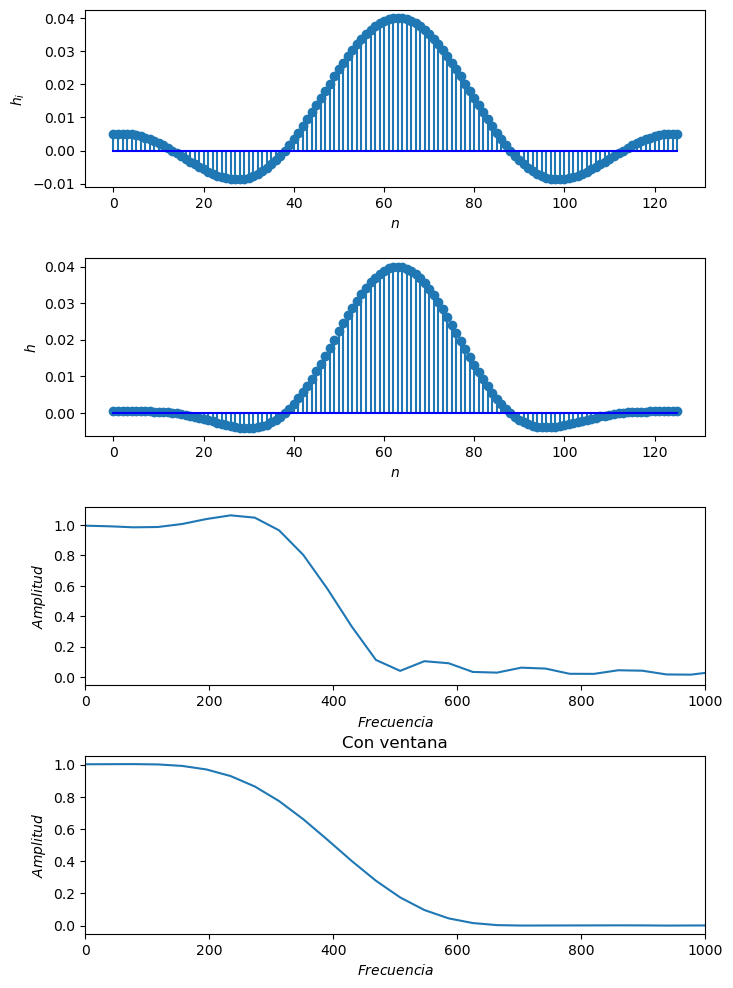

In [3]:
fig1,axs1 = subplots(4,1)
fig1.set_size_inches((8,12))
subplots_adjust(hspace=0.4)
ax=axs1[0]
ax.stem(n+M,hi,basefmt='b-')
ax.set_xlabel("$n$",fontsize=10)
ax.set_ylabel("$h_i$",fontsize=10)
ax=axs1[1]
ax.stem(n+M,h,basefmt='b-')
ax.set_xlabel("$n$",fontsize=10)
ax.set_ylabel("$h$",fontsize=10)
ax=axs1[2]
plt.title('Sin ventana')
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=1000,xmin=0)
ax=axs1[3]
plt.title('Con ventana')
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=1000,xmin=0)

Respuesta: La ventana suaviza las ondulaciones de la respuesta al impulso, reduciendo el numero de oscilaciones de la misma.
La ventana a su vez incide sobre las oscilaciones (Ripple) de la señal en frecuencia, reduciendo el fenomeno de GIBBS, también actua sobre el ancho de banda de transicion (Roll-off), y la banda de atenuación.

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">Contexto 2: </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;">Una vez recordadas sus clases de PDS en aquellos bochornosos días en la Universidad, usted decide aceptar el desafio puesto por la empresa de vida salvaje
. </span>

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">2. Identificando sonidos de animales</span></b><br>

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">2.1. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Se le suministra una lista de sonidos de animales (Ver carpeta), se le pide identifique que tipos de animales que puede escuchar en el audio. Diga que animales identifica en cada uno de los audios.

respuesta: Pajaritos, gallos, gansos, caballos, grillos y perro. 

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">2.2. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Como podrá haber notado existen distintos tipos de animales y especies en el audio. Las distinciones entre las especies no solo radica en el color y la apariencia entre ellas. Una de las principales características entre especies es el tipo de canto o sonidos, y la frecuencia a la que los emiten. Por ello para el siguiente punto, se le pide que investigue las frecuencias mas comunes para los animales identificados en el audio.

Respuesta:
1. Pajaritos: Generalmente se encuentran en el rango de frecuencias entre 1 kHz y 8 kHz. Algunas especies pueden tener vocalizaciones más altas, llegando hasta los 10 kHz o más.

2. Gallos: El canto del gallo se encuentra en el rango de frecuencias entre 1 kHz y 4 kHz.

3. Gansos: Los sonidos de los gansos tienen frecuencias bajas y resonantes. Se encuentran típicamente en el rango de frecuencias entre 300 Hz y 1.5 kHz.

4. Caballos: Los relinchos y los sonidos vocales de los caballos se encuentran generalmente en el rango de frecuencias entre 100 Hz y 8 kHz.

5. Grillos: El sonido característico de los grillos es generado por su canto. Las frecuencias de los cantos de los grillos varían, pero suelen estar en el rango de 2 kHz a 8 kHz.

6. Perro: Los ladridos y vocalizaciones de los perros pueden variar en frecuencia dependiendo de la raza y el tamaño. En general, los ladridos pueden abarcar desde aproximadamente 50 Hz hasta 6 kHz. 

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">3. Con las manos en el filtro</span></b><br>

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">3.1. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Los investigadores deciden suministrarle una lista de los posibles sonidos que podría escuchar en los audios: Pajaritos, gallos, gansos, caballos, grillos, rio, viento, humanos y perro. Seleccione su correspondiente audio acorde al ultimo digito de su cedula, cargue la señal y grafiquela en el tiempo. No olvide normizar la señal  en el proceso.
    


| <center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;"> Ultimo digito Cedula</span></center>|<center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;">Tipo de ventana</span></center>|
|---------------------------                                                          |---------------------------        |
| <center>1,2</center>|<center>1.wav</center>        |
| <center>3,9</center>|<center>2.wav</center>        |
| <center>4 </center>|<center>3.wav</center>|
| <center>5</center>|<center>4.wav</center>|
| <center>6</center>|<center>5.wav</center>|
| <center>7,8</center>|<center>6.wav</center>|

Se le suministra el siguiente codigo para realizar la extracción de datos del audio:

In [4]:
from IPython.display import Audio  #para escuchar la señal
import librosa #libreria para la lectura de audios
file_audio=('6.wav') #Ruta del archivo con la señal
x, fs=librosa.load(file_audio, sr=None)


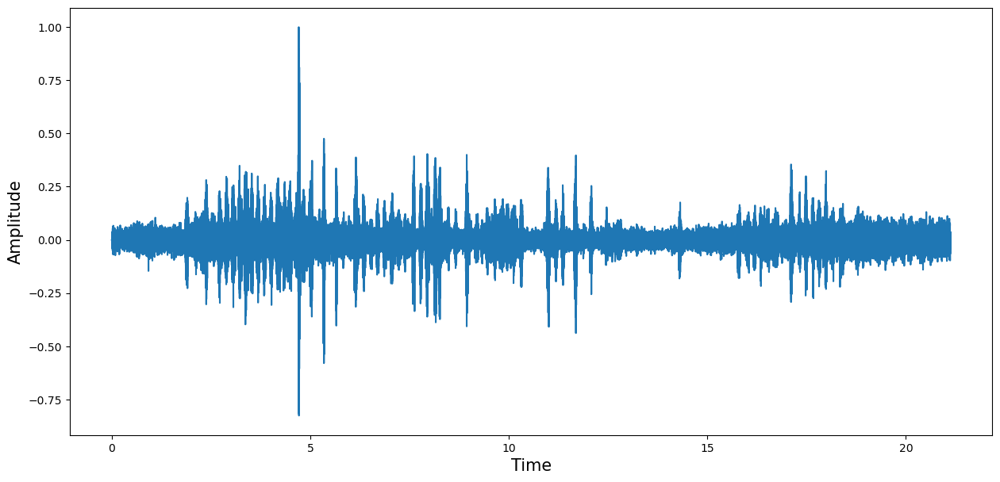

In [5]:
#Respuesta 3.1
x=x/float(max(abs(x)))  #Escala de amplitud de la señal
t=np.arange(0,float(len(x))/fs, 1/fs)  #vector de tiempo
x=x-np.mean(x)
plt.figure(figsize=(15,7))
plt.plot(t,x)  #graficacion
plt.xlabel('Time',fontsize=15)
plt.ylabel('Amplitude',fontsize=15)
plt.show()
Audio(x,rate=fs)  #para escuchar la señal si se desea

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">3.2. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Aplique el primer fltro construido a la señal de audio, ¿El audio ha sufrido alguna variación?¿Qué animales logra distinguir en el audio? Si el audio no ha sufrido modificaciones destacables o en caso tal no escuche algún tipo de animal, modifique la frecuencia de corte de tal forma que pueda escuchar algo. Justifique que valor puso y responda las anteriores preguntas.

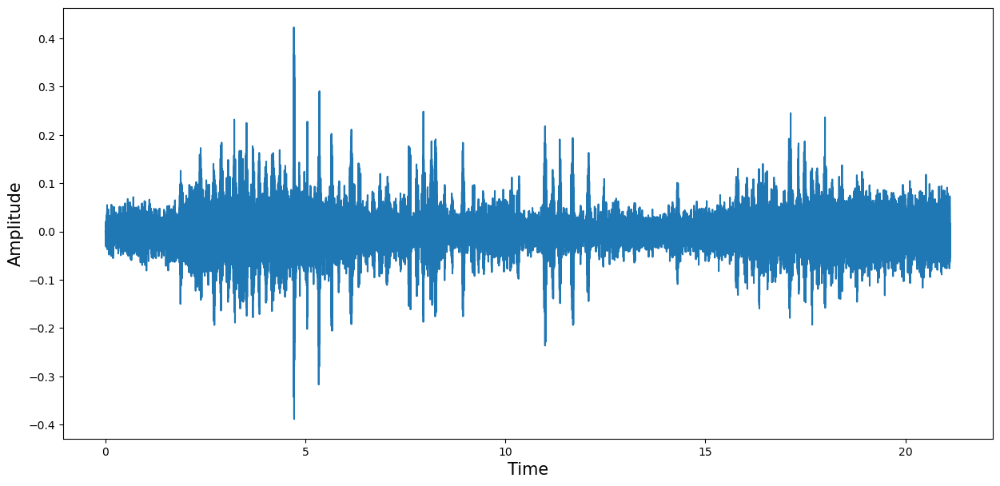

In [6]:
import scipy.signal as signal

# Aplicar el filtro a la señal
filtered_signal = signal.lfilter(h, 1, x)

# Graficar la señal filtrada
plt.figure(figsize=(15,7))
plt.plot(t, filtered_signal)
plt.xlabel('Time', fontsize=15)
plt.ylabel('Amplitude', fontsize=15)
plt.show()

# Escuchar la señal filtrada
Audio(filtered_signal, rate=fs)

Respuesta: El audio ha sufrido variación tal que solo se escuchan los sonidos emitidos por los ganzos, esto es debido a qué los gansos poseen rango de frecuencias entre 300 Hz y 1.5 kHz

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">4. El último maestro del filtrado</span></b><br>

<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">4.1. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Usted con la percepción de la realidad alterada y la frecuencia de corte anterior, decide crear un filtro Pasa-altas, el objetivo es ser capaz de escuchar los animales omitidos con el filtro pasabajas, y discriminar a quellos que pudo escuchar en el primer audio. ¿Logró su cometido? Sino, ¿Por qué no pudo lograrlo?, ¿Como lo lograría?

Orden del filtro:  63


C:\Users\Jonni\AppData\Local\Temp\ipykernel_15752\631256279.py:23: RuntimeWarning: invalid value encountered in divide
  hi= -(wc/np.pi)*(np.sin(wc*n)/(wc*n))


(0.0, 3000.0, -0.04998301097999022, 1.0521530158834507)

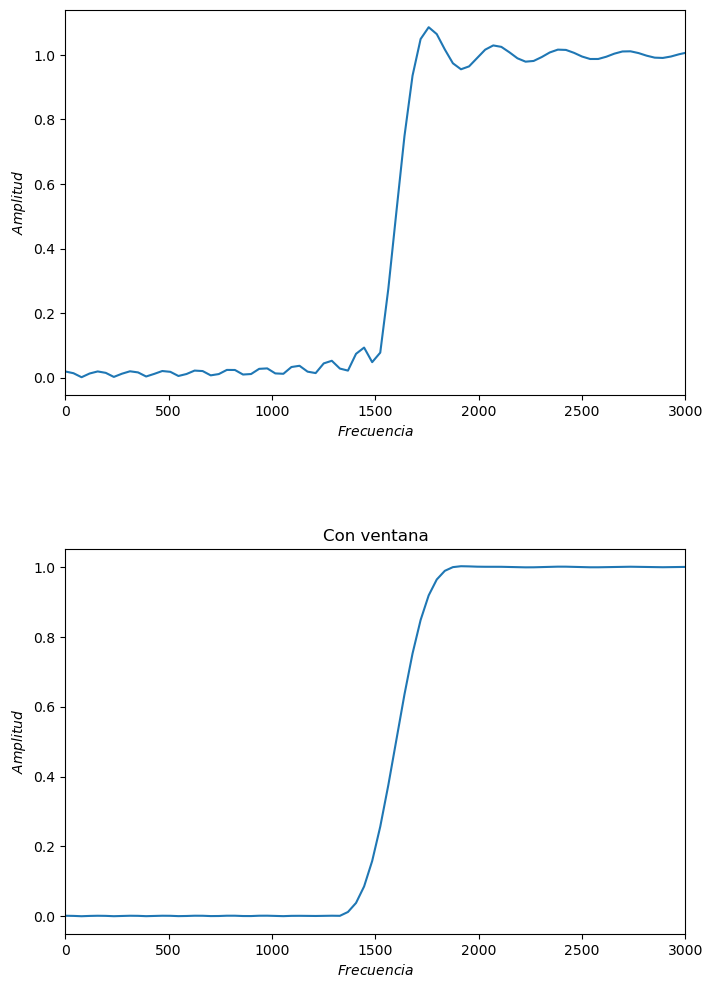

In [7]:
import scipy.signal as signal
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pylab import *
%matplotlib inline
# Parámetros del filtro
fs = 20000  # Frecuencia de muestreo en Hz
fc = 1600
# Frecuencia de corte en Hz
Adb=0 # Ganancia del filtro en decibeles
N = 512 # Numero de puntos de la FFT
BW=200 # Ancho de banda en la banda de transicion
bwn=2*np.pi*BW/fs # ancho de banda  normalizado en radianes

M=int(4/bwn) # orden estimado del filtro
print('Orden del filtro: ', M)

n = np.arange(-M,M)
wc = 2 * np.pi * fc/fs

# Generar los coeficientes del filtro pasabajas
#hi = ((wc/np.pi) * np.sin(wc*n/np.pi))/(wc*n/np.pi)
hi= -(wc/np.pi)*(np.sin(wc*n)/(wc*n))
hi[n==0] = 1 - wc/np.pi

# Calcular la respuesta al impulso del filtro
t = np.arange(len(hi))  # Eje temporal


def choose_windows(name='Hamming', N=20):
    # Rect/Hanning/Hamming/Blackman
    if name == 'Hamming':
        window = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
        
    elif name == 'Hanning':
        window = np.array([0.5 - 0.5 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Rect':
        window = np.ones(N)
    elif name == 'black':
        window = np.array([0.42-0.5*np.cos((2*np.pi*n)/(N-1))+0.08*np.cos((4*np.pi*n)/(N-1))for n in range(N)])
    return window

Ventana = choose_windows(name='Hamming', N=len(n))
h=hi*Ventana # Multiplico la respuesta ideal por la ventana
#Se crea la ganancia del filtro
A=np.sqrt(10**(0.1*Adb))
h=h*A # Ganancia del filtro
w1,Hh1 = signal.freqz(hi,1,whole=True, worN=N) # Respuesta en frecuencia del filtro sin enventanado
w2,Hh2 = signal.freqz(h,1,whole=True, worN=N) # Respuesta en frecuencia del filtro con enventanado
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((8,12))
subplots_adjust(hspace=0.4)
ax=axs1[0]
plt.title('Sin ventana')
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=3000,xmin=0)
ax=axs1[1]
plt.title('Con ventana')
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=3000,xmin=0)

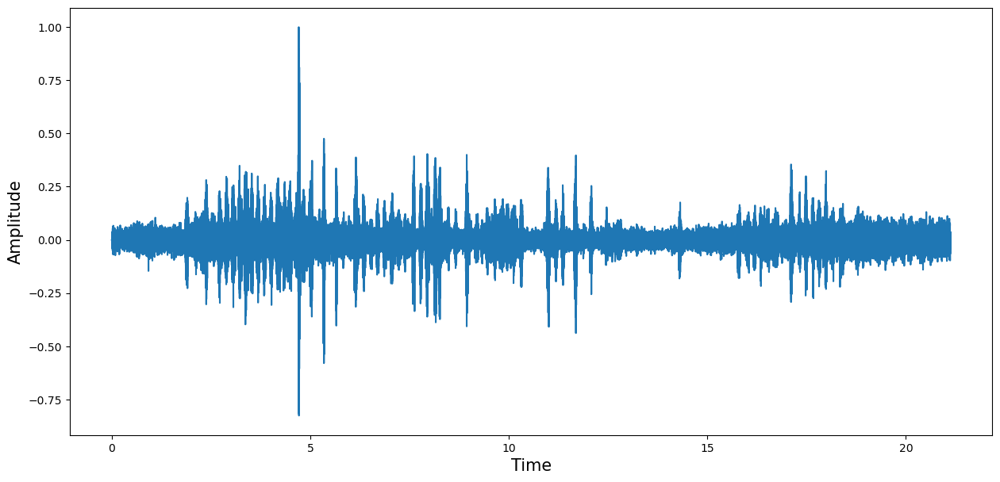

In [8]:
from IPython.display import Audio  #para escuchar la señal
import librosa #libreria para la lectura de audios
file_audio=('6.wav') #Ruta del archivo con la señal
x, fs=librosa.load(file_audio, sr=None)
#Respuesta 3.1
x=x/float(max(abs(x)))  #Escala de amplitud de la señal
t=np.arange(0,float(len(x))/fs, 1/fs)  #vector de tiempo
x=x-np.mean(x)
plt.figure(figsize=(15,7))
plt.plot(t,x)  #graficacion
plt.xlabel('Time',fontsize=15)
plt.ylabel('Amplitude',fontsize=15)
plt.show()
Audio(x,rate=fs)  #para escuchar la señal si se desea

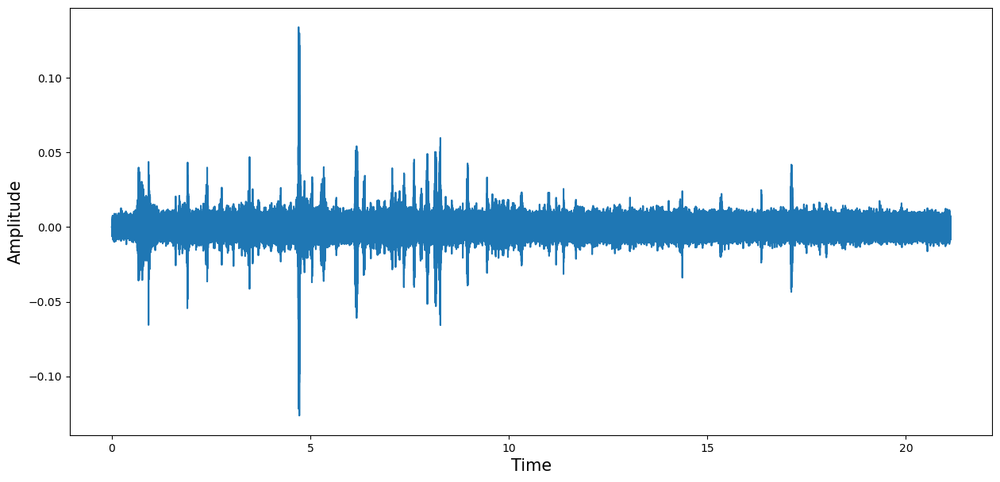

In [9]:
import scipy.signal as signal

# Aplicar el filtro a la señal
filtered_signal = signal.lfilter(h, 1, x)

# Graficar la señal filtrada
plt.figure(figsize=(15,7))
plt.plot(t, filtered_signal)
plt.xlabel('Time', fontsize=15)
plt.ylabel('Amplitude', fontsize=15)
plt.show()

# Escuchar la señal filtrada
Audio(filtered_signal, rate=fs)

Respuesta: con la misma frecuencia de corte, no se logra discriminar el sonido de los gansos, esto es debido a que este sonido actua sobre una banda de frecuencia, si se anulan las frecuencias bajas dadas por la frecuencia de corte en el pasabajas, seguirá existiendo las que son propias del animal en dicha banda de frecuencia. Por ello para solucionar dicho problema, se aumenta la frecuencia de corte en el pasaaltas superior a la banda base de los gansos: fc = 1600Hz, recordando que los gansos emiten sus sonidos en un rango de 300Hz a 1500Hz comunmente.

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">5. Demostrando su conocimiento</span></b><br>

<b><span style="font-size:20px; font-family: 'Times New Roman', Times, serif;">Contexto 3: </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> A los expertos les ha quedado claro que usted tiene pleno control sobre el conocimiento de los filtros, sin embargo, cegado por la fama y el deseo de presumir sus capacidades, usted decide aplicar filtros pasabanda o rechazabanda según el ultimo digito de la cédula. </span> 

| <center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;"> Último digito Cedula</span></center>|<center><span style="font-size:16px; font-family: 'Times New Roman', Times, serif;">Tipo de filtro</span></center>|
|---------------------------                                                          |---------------------------        |
| <center>1,3,5,7,9</center>|<center>Rechaza-Banda</center>        |
| <center>2,4,6,8</center>|<center>Pasa-Banda</center>        |


<b><span style="font-size:15px; font-family: 'Times New Roman', Times, serif;">5.1. </span></b><span style="font-size:15px;font-family: 'Times New Roman', Times, serif;"> Usted decide discriminar o seleccionar unicamente una banda de frecuencia asociada a uno de los animales identificados en el audio. ¿Logra su comedito?¿Qué diferencia hay entre el proceso aplicado para el filtro pasabajas y pasa altas?

Orden del filtro:  63


C:\Users\Jonni\AppData\Local\Temp\ipykernel_15752\2425561918.py:24: RuntimeWarning: invalid value encountered in divide
  hi= (wc1/np.pi)*(np.sin(wc1*n)/(wc1*n))-(wc2/np.pi)*(np.sin(wc2*n)/(wc*n))


(0.0, 3000.0, -0.04984803545164638, 1.0518913964807193)

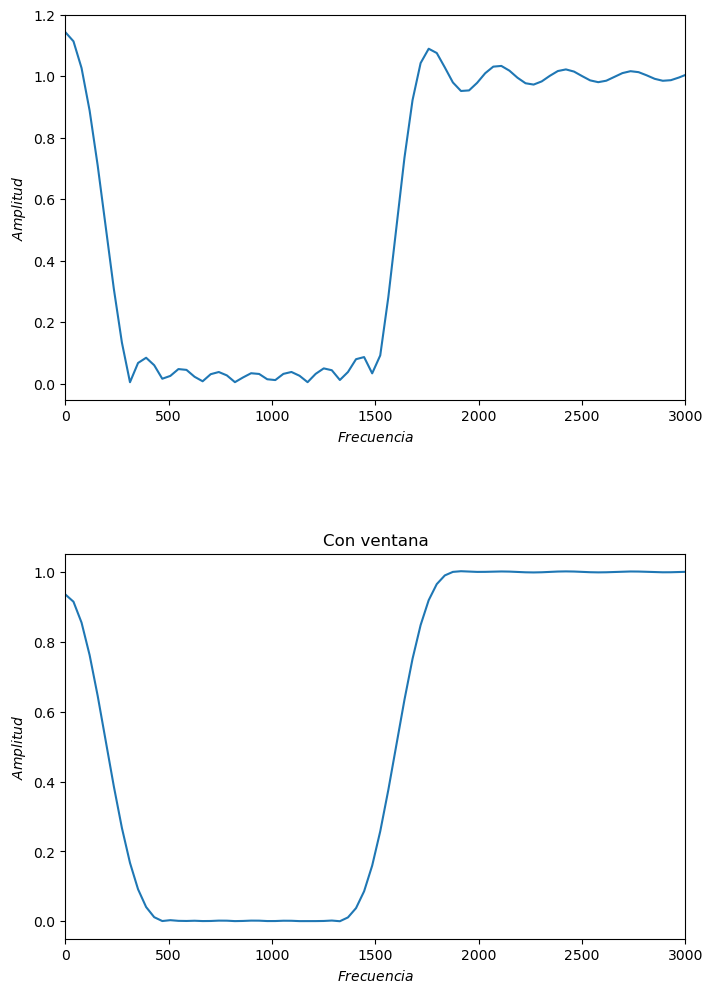

In [10]:
import scipy.signal as signal
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pylab import *
%matplotlib inline
# Parámetros del filtro
fs = 20000  # Frecuencia de muestreo en Hz
fc1=200.0
fc2=1600.0
# Frecuencia de corte en Hz
Adb=0 # Ganancia del filtro en decibeles
N = 512 # Numero de puntos de la FFT
BW=200 # Ancho de banda en la banda de transicion
bwn=2*np.pi*BW/fs # ancho de banda  normalizado en radianes

M=int(4/bwn) # orden estimado del filtro
print('Orden del filtro: ', M)

n = np.arange(-M,M)
wc1 = 2*np.pi*fc1/fs # frecuencia de corte normalizada en radianes
wc2= 2*np.pi*fc2/fs

# Generar los coeficientes del filtro pasabajas
hi= (wc1/np.pi)*(np.sin(wc1*n)/(wc1*n))-(wc2/np.pi)*(np.sin(wc2*n)/(wc*n))
hi[n==0] = 1 - (wc2/np.pi-wc1/np.pi)

# Calcular la respuesta al impulso del filtro
t = np.arange(len(hi))  # Eje temporal


def choose_windows(name='Hamming', N=20):
    # Rect/Hanning/Hamming/Blackman
    if name == 'Hamming':
        window = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
        
    elif name == 'Hanning':
        window = np.array([0.5 - 0.5 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Rect':
        window = np.ones(N)
    elif name == 'black':
        window = np.array([0.42-0.5*np.cos((2*np.pi*n)/(N-1))+0.08*np.cos((4*np.pi*n)/(N-1))for n in range(N)])
    return window

Ventana = choose_windows(name='Hamming', N=len(n))
h=hi*Ventana # Multiplico la respuesta ideal por la ventana
#Se crea la ganancia del filtro
A=np.sqrt(10**(0.1*Adb))
h=h*A # Ganancia del filtro
w1,Hh1 = signal.freqz(hi,1,whole=True, worN=N) # Respuesta en frecuencia del filtro sin enventanado
w2,Hh2 = signal.freqz(h,1,whole=True, worN=N) # Respuesta en frecuencia del filtro con enventanado
fig1,axs1 = subplots(2,1)
fig1.set_size_inches((8,12))
subplots_adjust(hspace=0.4)
ax=axs1[0]
plt.title('Sin ventana')
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=3000,xmin=0)
ax=axs1[1]
plt.title('Con ventana')
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)))
ax.set_xlabel("$Frecuencia$",fontsize=10)
ax.set_ylabel("$Amplitud$",fontsize=10)
ax.axis(xmax=3000,xmin=0)

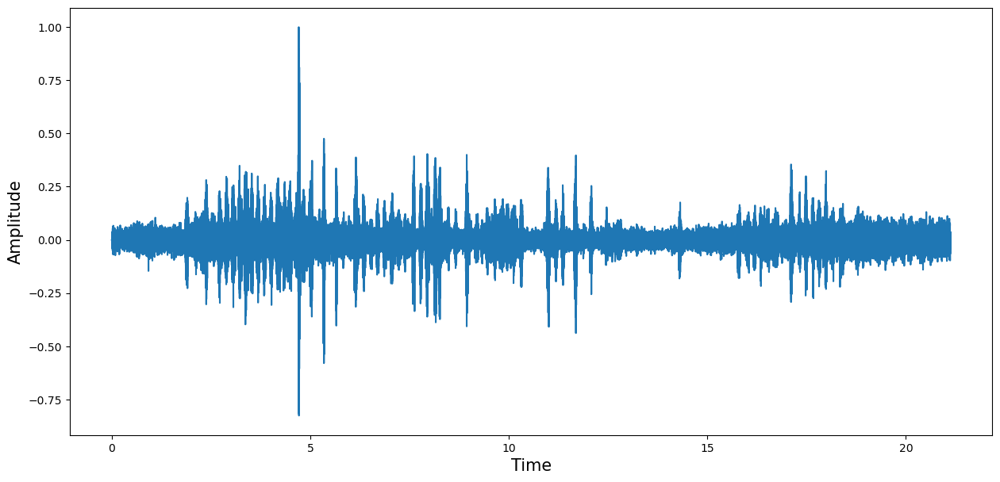

In [11]:
from IPython.display import Audio  #para escuchar la señal
import librosa #libreria para la lectura de audios
file_audio=('6.wav') #Ruta del archivo con la señal
x, fs=librosa.load(file_audio, sr=None)
#Respuesta 3.1
x=x/float(max(abs(x)))  #Escala de amplitud de la señal
t=np.arange(0,float(len(x))/fs, 1/fs)  #vector de tiempo
x=x-np.mean(x)
plt.figure(figsize=(15,7))
plt.plot(t,x)  #graficacion
plt.xlabel('Time',fontsize=15)
plt.ylabel('Amplitude',fontsize=15)
plt.show()
Audio(x,rate=fs)  #para escuchar la señal si se desea


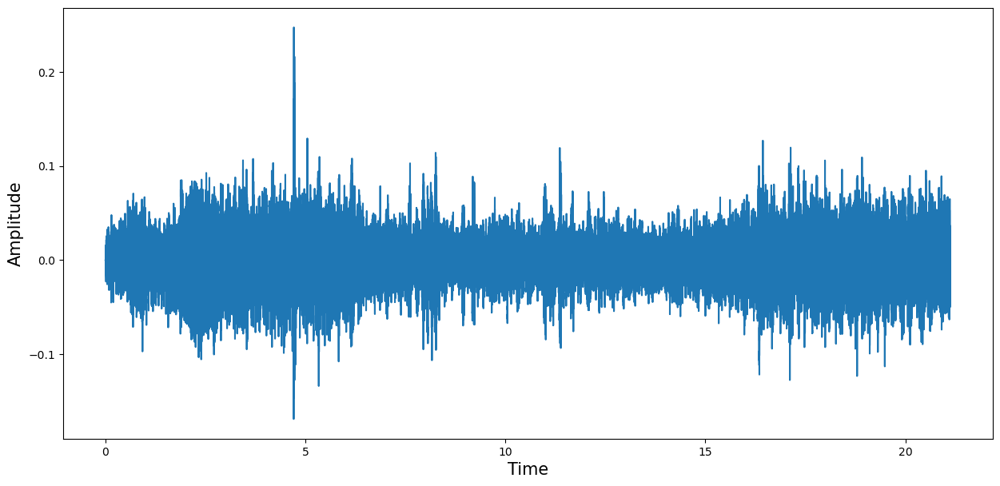

In [12]:
import scipy.signal as signal

# Aplicar el filtro a la señal
filtered_signal = signal.lfilter(h, 1, x)

# Graficar la señal filtrada
plt.figure(figsize=(15,7))
plt.plot(t, filtered_signal)
plt.xlabel('Time', fontsize=15)
plt.ylabel('Amplitude', fontsize=15)
plt.show()

# Escuchar la señal filtrada
Audio(filtered_signal, rate=fs)

Respuesta: Pese a haber omitido el rango de frecuencias de los gansos, es posible escuchar algunos debido a las frecuencias bajas restantes del filtro, sin embargo, no todas las frecuencias del audio de los gansos son apreciables, lo que conlleva a pensar que el filtro cumple su función y que el desconocimiento del rango sonoro de las especies de gansos puede influir en la discriminación del filtrado.

### 6. Conclusiones

1. Los filtros FIR se pueden utilizar para separar las frecuencias de una señal de audio, lo que puede ser útil para aislar sonidos, cuando estos se enceuntran en frecuencais distintas, en este caso fueron animales.
2. Existen distintos tipos de filtros, muchos de ellos, discriminan frecuencias indeseadas, para determinar que frecuencias discriminan hay que tener conocimiento de las frecuencias de corte sobre las cuales operan y el ancho de banda de transición.
3. Los filtros FIR se pueden diseñar utilizando diferentes tipos de ventanas, como Hamming, Hanning, Rectangular, Blackman, entre otras. Estas ventanas pueden mejorar las características del filtro, como la selectividad y la atenuación de frecuencias no deseadas.